<a href="https://colab.research.google.com/github/praveenkumarbalakrishnan/tasks/blob/main/SIG788_Engineering__AI_solutions_Task_4_2D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Title:** Task 4.2D: SIG788 Engineering AI solutions

**Name:** Praveenkumar Balakrishnan

**Student Number:** 223029369

**Email Address:** s223029369@deakin.edu.au

# Install

In [1]:
!pip install azure-cognitiveservices-vision-customvision

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Import

In [2]:
import json
import os
import time
import uuid

import cv2

import pandas as pd

from google.colab.patches import cv2_imshow

from azure.cognitiveservices.vision.customvision.training import CustomVisionTrainingClient
from azure.cognitiveservices.vision.customvision.prediction import CustomVisionPredictionClient
from azure.cognitiveservices.vision.customvision.training.models import ImageFileCreateBatch, ImageFileCreateEntry, Region
from msrest.authentication import ApiKeyCredentials

Added subscription keys and endpoint

In [3]:
ENDPOINT = "https://custimvisiongroup.cognitiveservices.azure.com/"
training_key = "d58fa4b5660e476db8c9ee0005202756"
prediction_resource_id = "/subscriptions/84bd4663-5df3-49e8-943e-ba5879616bac/resourceGroups/custom_vision_resourse_group/providers/Microsoft.CognitiveServices/accounts/custimvisiongroup-Prediction"

Instantiated training and prediction clients with the keys and endpoints

In [4]:
credentials = ApiKeyCredentials(in_headers={"Training-key": training_key})
trainer = CustomVisionTrainingClient(ENDPOINT, credentials)

Created a new custom vision project, used universal unique identifier to avoid project name collisions

In [ ]:
publish_iteration_name = "TrackingModel"
obj_detection_domain = next(
    domain for domain in trainer.get_domains() \
    if domain.type == "ObjectDetection" and domain.name == "General")
project = trainer.create_project(
    str(uuid.uuid4()), domain_id=obj_detection_domain.id)

In [5]:
publish_iteration_name = "TrackingModel"
project = trainer.get_project('594cad94-48af-4711-aadf-86dbc2d48366')

Created tags for car and truck

In [ ]:
car_tag = trainer.create_tag(project.id, "car")
truck_tag = trainer.create_tag(project.id, "truck")

Define Image folder

In [6]:
images_folder = "/content/drive/MyDrive/Images/"

Created a function to generate the tag image regions using the csv file extracted from VGG Image Annotator tool. To tag the images in object detection project we need to normalize the coordinates so normalized the cordinates using the height and width of the image and added the image and region details in the corresponding category

In [ ]:
def generate_tag_image_regions(images_folder, df):
  """
  This function is to tag image regions and return normalized bounding box cordinates

  Parameters
  ----------
  images_folder: str
    Image foldder path
  df: Pandas DataFrame
    Dataframe with filename and it's image region

  Returns
  -------
  car_image_region_dict: dict
    Car image region dictionary
  truck_image_region_dict: dict
    Truck image regions dictionary
  """
  car_image_region_dict = {}
  truck_image_region_dict = {}
  for i, row in df.iterrows():
    h_img, w_img, _ = cv2.imread(
        os.path.join(images_folder, row['filename'])).shape
    bb_values = json.loads(row['region_shape_attributes'])
    tag_dict = json.loads(row['region_attributes'])
    x = bb_values['x'] / w_img
    y = bb_values['y'] / h_img 
    w = bb_values['width'] / w_img
    h = bb_values['height'] / h_img
    if tag_dict['name'].strip() == 'car':
      car_image_region_dict[row['filename'].strip()] = [x, y, w, h]
    elif tag_dict['name'].strip() == 'truck':
      truck_image_region_dict[row['filename'].strip()] = [x, y, w, h]
  return car_image_region_dict, truck_image_region_dict

Generated image regions

In [ ]:
regions_df = pd.read_csv(os.path.join(images_folder, 'regions.csv'))
car_image_regions, truck_image_regions = generate_tag_image_regions(images_folder, regions_df)

Uploaded each images with it's normalized image co-ordinates

In [ ]:
base_image_location = images_folder

# Go through the data table above and create the images
print ("Adding images...")
tagged_images_with_regions = []

for file_name in car_image_regions.keys():
    x,y,w,h = car_image_regions[file_name]
    regions = [Region(tag_id=car_tag.id, left=x,top=y,width=w,height=h)]

    with open(
        os.path.join(
            base_image_location, file_name
            ), mode="rb") as image_contents:
        tagged_images_with_regions.append(
            ImageFileCreateEntry(
                name=file_name,
                contents=image_contents.read(),
                regions=regions))
        
for file_name in truck_image_regions.keys():
    x,y,w,h = truck_image_regions[file_name]
    regions = [Region(tag_id=truck_tag.id, left=x,top=y,width=w,height=h)]

    with open(
        os.path.join(
            base_image_location, file_name
            ), mode="rb") as image_contents:
        tagged_images_with_regions.append(
            ImageFileCreateEntry(
                name=file_name,
                contents=image_contents.read(),
                regions=regions))

upload_result = trainer.create_images_from_files(
    project.id, ImageFileCreateBatch(images=tagged_images_with_regions))

Adding images...


Trained the model on multiple iterations by adding new images to get the reasonable prediction

In [ ]:
print ("Training...")
iteration = trainer.train_project(project.id)
while (iteration.status != "Completed"):
    iteration = trainer.get_iteration(project.id, iteration.id)
    print ("Training status: " + iteration.status)
    time.sleep(1)

Training...
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training


# Published the Trained model

In [ ]:
# The iteration is now trained. Publish it to the project endpoint
trainer.publish_iteration(
    project.id, iteration.id, publish_iteration_name, prediction_resource_id)
print ("Done!")

Done!


In [7]:
prediction_key = "3b635d23b51d4bb1a43da56d24753d64"
ENDPOINT = "https://custimvisiongroup-prediction.cognitiveservices.azure.com/"
credentials = ApiKeyCredentials(in_headers={"Prediction-key": prediction_key})
predictor = CustomVisionPredictionClient(endpoint=ENDPOINT, credentials=credentials)

In [ ]:
trackerType = "MEDIANFLOW"   
multiTracker = cv2.legacy.MultiTracker_create()
tracker = cv2.legacy.TrackerMedianFlow_create()

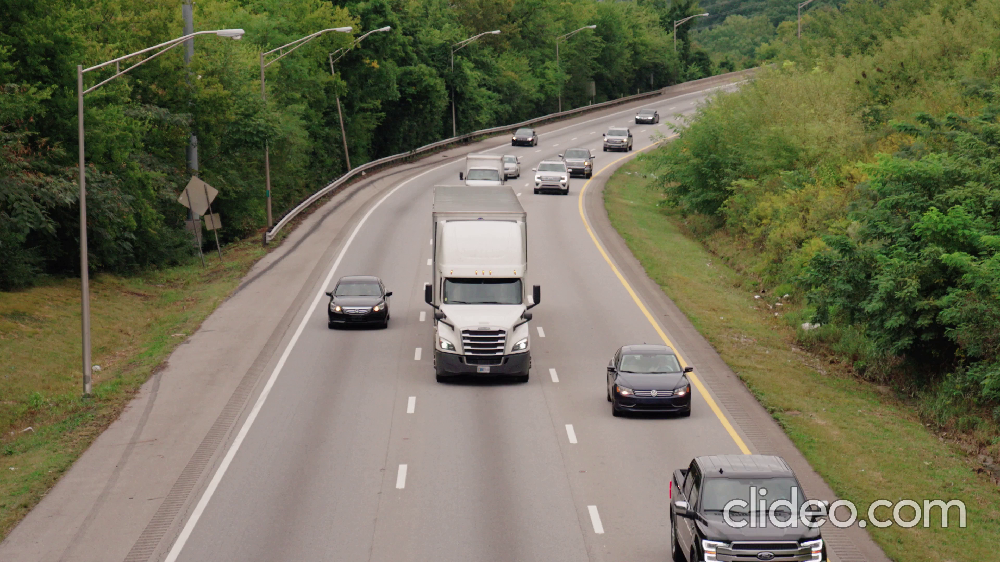

In [28]:
cap = cv2.VideoCapture('/content/drive/MyDrive/Images/prediction_vid.mp4')
count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if ret:
        cv2.imwrite(os.path.join(images_folder,'frame{:d}.jpg'.format(count)), frame)
        with open(os.path.join(images_folder, 'frame{:d}.jpg'.format(count)), mode="rb") as test_data:
          results = predictor.detect_image(
              project.id, publish_iteration_name, test_data)
        count += 30 # i.e. at 30 fps, this advances one second
        cap.set(cv2.CAP_PROP_POS_FRAMES, count)

        success, boxes = multiTracker.update(frame)
        for i, newbox in enumerate(boxes):
          p1 = (int(newbox[0]), int(newbox[1]))
          p2 = (int(newbox[0] + newbox[2]), int(newbox[1] + newbox[3]))
          cv2.rectangle(frame, p1, p2, (0, 255, 0), 2, 1)
        cv2_imshow(frame)

        for prediction in results.predictions:
          if prediction.probability > 0.1:
            bbox = (
                prediction.bounding_box.left, prediction.bounding_box.top,
                prediction.bounding_box.width, prediction.bounding_box.height)
            multiTracker.add(tracker, frame, bbox)

        break
    else:
        cap.release()
        break

In [34]:
frame.shape

(255, 255, 3)

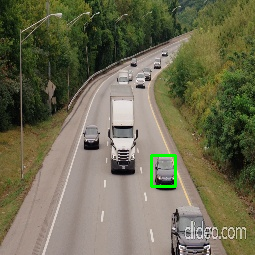

	car: 87.02% bbox.left = 0.59, bbox.top = 0.61, bbox.width = 0.09, bbox.height = 0.12


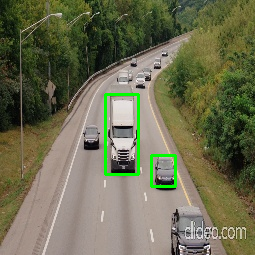

	car: 70.09% bbox.left = 0.41, bbox.top = 0.37, bbox.width = 0.13, bbox.height = 0.32


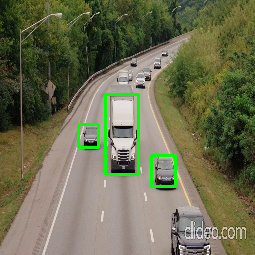

	car: 68.60% bbox.left = 0.31, bbox.top = 0.49, bbox.width = 0.08, bbox.height = 0.09


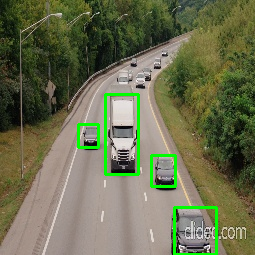

	truck: 28.80% bbox.left = 0.68, bbox.top = 0.81, bbox.width = 0.17, bbox.height = 0.19


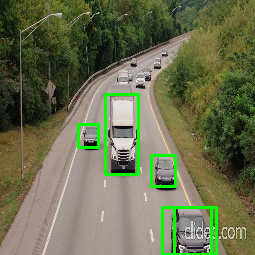

	car: 16.13% bbox.left = 0.64, bbox.top = 0.81, bbox.width = 0.19, bbox.height = 0.19


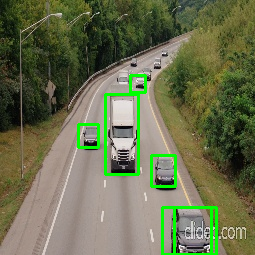

	car: 15.10% bbox.left = 0.51, bbox.top = 0.30, bbox.width = 0.06, bbox.height = 0.06


In [48]:
from posix import WCONTINUED
prediction_key = "3b635d23b51d4bb1a43da56d24753d64"
ENDPOINT = "https://custimvisiongroup-prediction.cognitiveservices.azure.com/"
credentials = ApiKeyCredentials(in_headers={"Prediction-key": prediction_key})
predictor = CustomVisionPredictionClient(endpoint=ENDPOINT, credentials=credentials)

with open(os.path.join(images_folder, "frame0.jpg"), mode="rb") as test_data:
    results = predictor.detect_image(
        project.id, publish_iteration_name, test_data)
    
frame = cv2.imread(os.path.join(images_folder, "frame0.jpg"))
H = frame.shape[0]
W = frame.shape[1]

# Display the results.    
for prediction in results.predictions:
  if prediction.probability > 0.15:
    w = prediction.bounding_box.width * W
    h = prediction.bounding_box.height * H
    x = prediction.bounding_box.left * W
    y = prediction.bounding_box.top * H


    box = np.array([x, y, x + w, y + h])
    (startX, startY, endX, endY) = box.astype("int")
    cv2.rectangle(frame, (startX, startY), (endX, endY),(0, 255, 0), 2)
    cv2_imshow(frame)
    print("\t" + prediction.tag_name + ": {0:.2f}% bbox.left = {1:.2f}, bbox.top = {2:.2f}, bbox.width = {3:.2f}, bbox.height = {4:.2f}".format(prediction.probability * 100, prediction.bounding_box.left, prediction.bounding_box.top, prediction.bounding_box.width, prediction.bounding_box.height))

In [19]:
results.predictions[0].probability

0.9206635

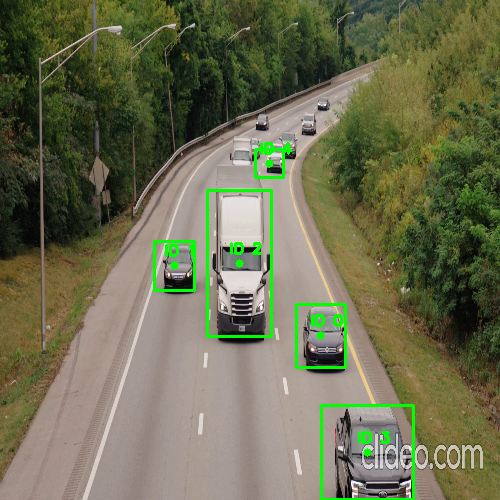

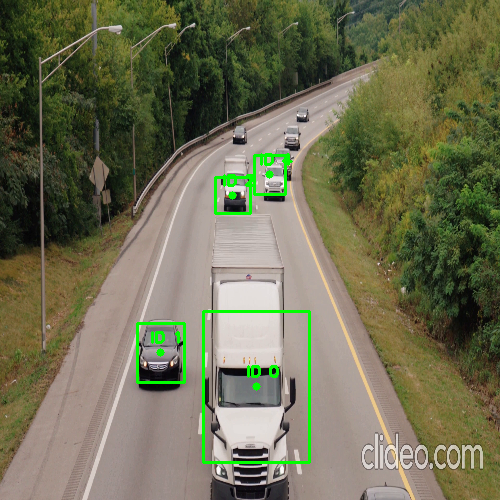

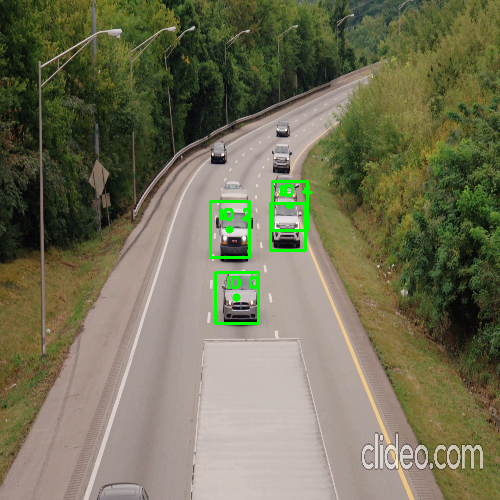

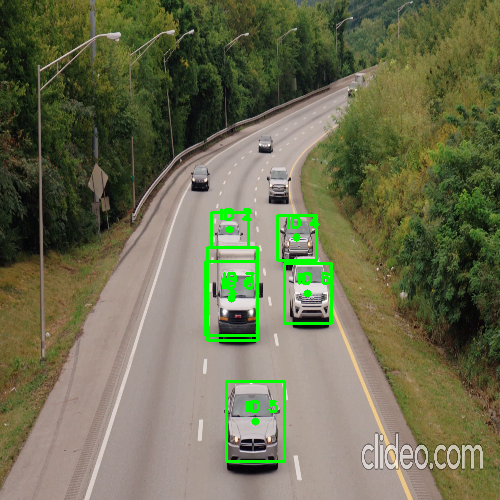

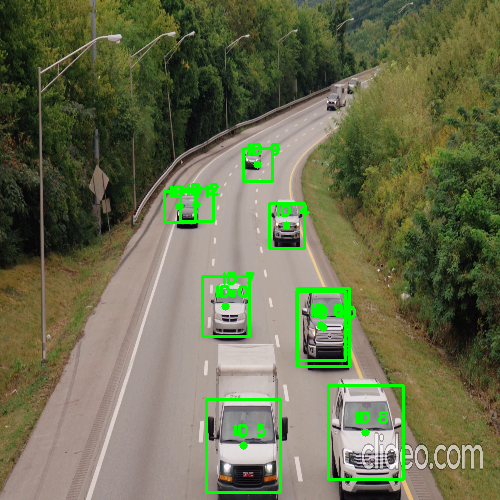

In [11]:
import cv2
import numpy as np
import math

cap = cv2.VideoCapture('/content/drive/MyDrive/Images/test_vid.mp4')
ct = CentroidTracker(maxDisappeared=0)
(H, W) = (None, None)
# Initialize count
count = 0
center_points_prev_frame = []

tracking_objects = {}
track_id = 0

fps_cnt = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break
    
    targetSize = 500
    frame = cv2.resize(frame, (targetSize, targetSize))
    
    cv2.imwrite(
        os.path.join(images_folder,'frame{:d}.jpg'.format(fps_cnt)), frame)
    count += 1

    H = frame.shape[0]
    W = frame.shape[1]  

    # Point current frame
    center_points_cur_frame = []

    # Detect objects on frame
    with open(
        os.path.join(images_folder, 'frame{:d}.jpg'.format(fps_cnt)), mode="rb"
        ) as test_data:
        results = predictor.detect_image(
          project.id, publish_iteration_name, test_data)
        class_ids = []
        scores = []
        boxes = []
        for prediction in results.predictions:
          if prediction.probability > 0.15:
            class_ids.append(prediction.tag_name)
            scores.append(prediction.probability * 100)
            w = prediction.bounding_box.width * W
            h = prediction.bounding_box.height * H
            x = prediction.bounding_box.left * W
            y = prediction.bounding_box.top * H
            boxes.append(
                [x, y, x+w, y+h])

    rects = []
            
    for box in boxes:
      # original frame as named values
      box = np.array(box)
      (startX, startY, endX, endY) = box.astype("int")
      cv2.rectangle(frame, (startX, startY), (endX, endY),(0, 255, 0), 2)
      rects.append(box.astype("int"))

	# update our centroid tracker using the computed set of bounding
	# box rectangles
    objects = ct.update(rects)

	# loop over the tracked objects
    for (objectID, centroid) in objects.items():
      # draw both the ID of the object and the centroid of the
      # object on the output frame
      text = "ID {}".format(objectID)
      cv2.putText(frame, text, (centroid[0] - 10, centroid[1] - 10),
        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
      cv2.circle(frame, (centroid[0], centroid[1]), 4, (0, 255, 0), -1)
    fps_cnt += 30
    cap.set(cv2.CAP_PROP_POS_FRAMES, fps_cnt)
	# show the output frame
    cv2_imshow(frame)
    key = cv2.waitKey(1) & 0xFF

    # if the `q` key was pressed, break from the loop
    if key == ord("q"):
      break

cap.release()
cv2.destroyAllWindows()


In [9]:
from scipy.spatial import distance as dist
from collections import OrderedDict
import numpy as np

class CentroidTracker():
	def __init__(self, maxDisappeared=50):
		# initialize the next unique object ID along with two ordered
		# dictionaries used to keep track of mapping a given object
		# ID to its centroid and number of consecutive frames it has
		# been marked as "disappeared", respectively
		self.nextObjectID = 0
		self.objects = OrderedDict()
		self.disappeared = OrderedDict()

		# store the number of maximum consecutive frames a given
		# object is allowed to be marked as "disappeared" until we
		# need to deregister the object from tracking
		self.maxDisappeared = maxDisappeared

	def register(self, centroid):
		# when registering an object we use the next available object
		# ID to store the centroid
		self.objects[self.nextObjectID] = centroid
		self.disappeared[self.nextObjectID] = 0
		self.nextObjectID += 1

	def deregister(self, objectID):
		# to deregister an object ID we delete the object ID from
		# both of our respective dictionaries
		del self.objects[objectID]
		del self.disappeared[objectID]

	def update(self, rects):
		# check to see if the list of input bounding box rectangles
		# is empty
		if len(rects) == 0:
			# loop over any existing tracked objects and mark them
			# as disappeared
			for objectID in list(self.disappeared.keys()):
				self.disappeared[objectID] += 1

				# if we have reached a maximum number of consecutive
				# frames where a given object has been marked as
				# missing, deregister it
				if self.disappeared[objectID] > self.maxDisappeared:
					self.deregister(objectID)

			# return early as there are no centroids or tracking info
			# to update
			return self.objects

		# initialize an array of input centroids for the current frame
		inputCentroids = np.zeros((len(rects), 2), dtype="int")

		# loop over the bounding box rectangles
		for (i, (startX, startY, endX, endY)) in enumerate(rects):
			# use the bounding box coordinates to derive the centroid
			cX = int((startX + endX) / 2.0)
			cY = int((startY + endY) / 2.0)
			inputCentroids[i] = (cX, cY)

		# if we are currently not tracking any objects take the input
		# centroids and register each of them
		if len(self.objects) == 0:
			for i in range(0, len(inputCentroids)):
				self.register(inputCentroids[i])

		# otherwise, are are currently tracking objects so we need to
		# try to match the input centroids to existing object
		# centroids
		else:
			# grab the set of object IDs and corresponding centroids
			objectIDs = list(self.objects.keys())
			objectCentroids = list(self.objects.values())

			# compute the distance between each pair of object
			# centroids and input centroids, respectively -- our
			# goal will be to match an input centroid to an existing
			# object centroid
			D = dist.cdist(np.array(objectCentroids), inputCentroids)

			# in order to perform this matching we must (1) find the
			# smallest value in each row and then (2) sort the row
			# indexes based on their minimum values so that the row
			# with the smallest value as at the *front* of the index
			# list
			rows = D.min(axis=1).argsort()

			# next, we perform a similar process on the columns by
			# finding the smallest value in each column and then
			# sorting using the previously computed row index list
			cols = D.argmin(axis=1)[rows]

			# in order to determine if we need to update, register,
			# or deregister an object we need to keep track of which
			# of the rows and column indexes we have already examined
			usedRows = set()
			usedCols = set()

			# loop over the combination of the (row, column) index
			# tuples
			for (row, col) in zip(rows, cols):
				# if we have already examined either the row or
				# column value before, ignore it
				# val
				if row in usedRows or col in usedCols:
					continue

				# otherwise, grab the object ID for the current row,
				# set its new centroid, and reset the disappeared
				# counter
				objectID = objectIDs[row]
				self.objects[objectID] = inputCentroids[col]
				self.disappeared[objectID] = 0

				# indicate that we have examined each of the row and
				# column indexes, respectively
				usedRows.add(row)
				usedCols.add(col)

			# compute both the row and column index we have NOT yet
			# examined
			unusedRows = set(range(0, D.shape[0])).difference(usedRows)
			unusedCols = set(range(0, D.shape[1])).difference(usedCols)

			# in the event that the number of object centroids is
			# equal or greater than the number of input centroids
			# we need to check and see if some of these objects have
			# potentially disappeared
			if D.shape[0] >= D.shape[1]:
				# loop over the unused row indexes
				for row in unusedRows:
					# grab the object ID for the corresponding row
					# index and increment the disappeared counter
					objectID = objectIDs[row]
					self.disappeared[objectID] += 1

					# check to see if the number of consecutive
					# frames the object has been marked "disappeared"
					# for warrants deregistering the object
					if self.disappeared[objectID] > self.maxDisappeared:
						self.deregister(objectID)

			# otherwise, if the number of input centroids is greater
			# than the number of existing object centroids we need to
			# register each new input centroid as a trackable object
			else:
				for col in unusedCols:
					self.register(inputCentroids[col])

		# return the set of trackable objects
		return self.objects

In [ ]:
# python object_tracker.py --prototxt deploy.prototxt --model res10_300x300_ssd_iter_140000.caffemodel

# import the necessary packages
from imutils.video import VideoStream
import numpy as np
import argparse
import imutils
import time
import cv2

# initialize our centroid tracker and frame dimensions
ct = CentroidTracker()
(H, W) = (None, None)

# initialize the video stream and allow the camera sensor to warmup
print("[INFO] starting video stream...")
vs = VideoStream(src=0).start()
time.sleep(2.0)

# loop over the frames from the video stream
while True:
	# read the next frame from the video stream and resize it
	frame = vs.read()
	frame = imutils.resize(frame, width=400)

	# if the frame dimensions are None, grab them
	if W is None or H is None:
		(H, W) = frame.shape[:2]

	# construct a blob from the frame, pass it through the network,
	# obtain our output predictions, and initialize the list of
	# bounding box rectangles
	blob = cv2.dnn.blobFromImage(frame, 1.0, (W, H),
		(104.0, 177.0, 123.0))
	net.setInput(blob)
	detections = net.forward()
	rects = []

	# loop over the detections
	for i in range(0, detections.shape[2]):
		# filter out weak detections by ensuring the predicted
		# probability is greater than a minimum threshold
		if detections[0, 0, i, 2] > args["confidence"]:
			# compute the (x, y)-coordinates of the bounding box for
			# the object, then update the bounding box rectangles list
			box = detections[0, 0, i, 3:7] * np.array([W, H, W, H])
			rects.append(box.astype("int"))

			# draw a bounding box surrounding the object so we can
			# visualize it
			(startX, startY, endX, endY) = box.astype("int")
			cv2.rectangle(frame, (startX, startY), (endX, endY),
				(0, 255, 0), 2)

	# update our centroid tracker using the computed set of bounding
	# box rectangles
	objects = ct.update(rects)

	# loop over the tracked objects
	for (objectID, centroid) in objects.items():
		# draw both the ID of the object and the centroid of the
		# object on the output frame
		text = "ID {}".format(objectID)
		cv2.putText(frame, text, (centroid[0] - 10, centroid[1] - 10),
			cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
		cv2.circle(frame, (centroid[0], centroid[1]), 4, (0, 255, 0), -1)

	# show the output frame
	cv2.imshow("Frame", frame)
	key = cv2.waitKey(1) & 0xFF

	# if the `q` key was pressed, break from the loop
	if key == ord("q"):
		break

# do a bit of cleanup
cv2.destroyAllWindows()
vs.stop()